# Exploratory Data Analysis

In [1]:
#!python3 -m pip install geopanda

In [2]:
import pandas as pd
import os
import utm
import matplotlib.pyplot as plt
import plotly.express as px
import folium

/Users/lilynorthcutt/Documents/Projects/sierraNevadaAge/venv/lib/python3.9/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


In [3]:
# Set directory
os.chdir("..")
os.getcwd()

'/Users/lilynorthcutt/Documents/Projects/sierraNevadaAge'

We have 2 data sources:
1. Data from __csv__ file contains exact locaitons with their corresponding age
2. Data from __shapefile__ with polygons of region with corresponding general age

Lets first read in and look at the csv file data

## CSV File

In [4]:
csv_file_path = "Data/raw/attia_CentralSierraCretaceousIntrusionsGeochronologyData_forLily12082023.xlsx"
df_ages_raw = pd.read_excel(csv_file_path, sheet_name =  'CentralSierraNevada Rock Ages')

In [5]:
df_ages_raw.head()

,AnalysisName,OriginalName,Age,Uncertainty,Reference,Mineral,Method,RockType,Lithology,Unit,Group,Easting,Northing,Datum,DataComment
0,EL16-525,NaN,96.1,0.8,"Ardill et al., 2018",Zircon,spot analyses,Plutonic,granodiorite,Ellery Lake granodiorite,"unassigned, Tioga Pass",304057,4200841,NAD27 11S,NaN
1,HH16-522,NaN,96.4,1.1,"Ardill et al., 2018",Zircon,spot analyses,Plutonic,porphyritic granodiorite,porphyritic granodiorite of Lake Vernon,Jack Main Canyon intrusive suite,258103,4209586,NAD27 11S,NaN
2,TIOGA,NaN,101.0,1.5,"Ardill et al., 2018",Zircon,spot analyses,Plutonic,monzodiorite,Tioga Lake monzodiorite,Tioga Pass hypabyssal complex,301629,4200112,NAD27 11S,NaN
3,GP-2,NaN,102.2,1.0,"Ardill et al., 2018",Zircon,spot analyses,Plutonic,granodiorite,Illouette Creek granodiorite,Buena Vista Crest intrusive suite,269559,4172071,NAD27 11S,NaN
4,IMP39-A,NaN,104.2,1.2,"Ardill et al., 2018",Zircon,spot analyses,Plutonic,Grizzly Peak porphyritic tonalite,granodiorite of Grizzly Creek,"unassigned, Iron Mountain area",278808,4149668,NAD27 11S,NaN


As we can see from the dataframe above, each row contains ages for specific locations, as well as references from published research from which we got the date.
The uncertainty represents a subjective measure on how confident we are in the date.


In [6]:
df_ages_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 217 entries, 0 to 216
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   AnalysisName  217 non-null    object 
 1   OriginalName  170 non-null    object 
 2   Age           217 non-null    float64
 3   Uncertainty   217 non-null    float64
 4   Reference     217 non-null    object 
 5   Mineral       217 non-null    object 
 6   Method        217 non-null    object 
 7   RockType      217 non-null    object 
 8   Lithology     217 non-null    object 
 9   Unit          217 non-null    object 
 10  Group         217 non-null    object 
 11  Easting       217 non-null    object 
 12  Northing      217 non-null    object 
 13  Datum         213 non-null    object 
 14  DataComment   70 non-null     object 
dtypes: float64(2), object(13)
memory usage: 25.6+ KB


In [7]:
df_ages_raw.describe() #NOTE: easting and northing read in as strings b/c "NA*"

,Age,Uncertainty
count,217.000000,217.000000
mean,99.905253,2.899585
std,10.255814,3.848287
min,83.500000,0.040000
25%,91.450000,0.400000
50%,97.000000,1.100000
75%,106.300000,2.500000
max,124.200000,12.000000


## Data Cleaning
Before we dive into visualizing the data, let's first clean it and handle missing data.

In [8]:
# Columns with missing data
df_ages_raw.isnull().sum()

AnalysisName      0
OriginalName     47
Age               0
Uncertainty       0
Reference         0
Mineral           0
Method            0
RockType          0
Lithology         0
Unit              0
Group             0
Easting           0
Northing          0
Datum             4
DataComment     147
dtype: int64

The five columns with missing data are as follows:
- __OriginalName:__ If OriginalName col is empty, then the OriginalName is the same as AnalysisName
- __Easting:__ _(Not shown above)_ manual entries "NA*" input for missing values 
    - Not much can be done to get exact location, may use for some testing: 
        Predict age of entire area covered in paper, and take avgs => check if this avg age is similar to the age
        given)
- __Northing:__ _(Not shown above)_ manual entries "NA*" input for missing values
    - Same note as above
- __Datum:__ Missing for values we do not have a location -> nothing to be done to resolve
- __DataComment:__ Not all rows need comments, acceptable to be NA, however will be creating boolean cols based on the notes further on in the notebook. 

After resolving issues with missing data, we will separate the rows missing necessary features (easting and northing) into a separate dataframe

In [9]:
df_ages_raw['OriginalName'] = df_ages_raw['OriginalName'].fillna(df_ages_raw['AnalysisName'])
df_ages_raw['Easting'] = pd.to_numeric(df_ages_raw['Easting'].replace('NA*', pd.NA), errors = 'coerce')
df_ages_raw['Northing'] = pd.to_numeric(df_ages_raw['Northing'].replace('NA*', pd.NA), errors = 'coerce')
df_ages_raw.isnull().sum()

AnalysisName      0
OriginalName      0
Age               0
Uncertainty       0
Reference         0
Mineral           0
Method            0
RockType          0
Lithology         0
Unit              0
Group             0
Easting           4
Northing          4
Datum             4
DataComment     147
dtype: int64

In [10]:
# Create df with rows missing either easting or northing
invalid_df_ages = df_ages_raw[pd.isna(df_ages_raw['Easting']) | pd.isna(df_ages_raw['Northing'])].copy()
# Create df with invalid rows removed (i.e. not enough location info)
df_ages = df_ages_raw[pd.notna(df_ages_raw['Easting']) & pd.notna(df_ages_raw['Northing'])].copy()

print(f'Raw data size: {df_ages_raw.shape} \nUsable data size: {df_ages.shape} \nMissing location size {invalid_df_ages.shape}')

Raw data size: (217, 15) 
Usable data size: (213, 15) 
Missing location size (4, 15)


In [11]:
# Check for duplicates
if any(df_ages.duplicated()): print("There are duplicate rows")
else: print("No duplicated rows")

No duplicated rows


## Feature Engineering
Let's __summarize the DataComments__ column with additional columns to help us represent issues or inconsistencies present within the data. 

We will also add additional columns such as __year published__, __longitude__, __latitude__, etc.

In [12]:
# Summarize data column by adding: estimated location, and estimated uncertainty
location_estim_list = ["location not given", "location is a total guess", "approximate location"]
pattern = '|'.join(location_estim_list)
df_ages['locationEstimated'] = df_ages['DataComment'].str.contains(pattern, case = False, na = False)

df_ages['uncertaintyEstimated'] = df_ages['DataComment'].str.contains('no error given', case = False, na = False)
# df[df['uncertaintyEstimated'] == True]

In [13]:
# Add year published column, if not published make it current year
df_ages['year'] = df_ages['Reference'].str.extract(r'(\d+)', expand = False).fillna(2023).astype(int)
#df[['Reference', 'year']]

In [14]:
# Add lat and long
lat, long = utm.to_latlon(df_ages['Easting'], df_ages['Northing'], 11, 'S')
df_ages['lat'] = lat
df_ages['long'] = long

Let's split the data into different sections based on Easting and Northing

To figure choose smartly, lets look at the number of data points taken across northing and easting

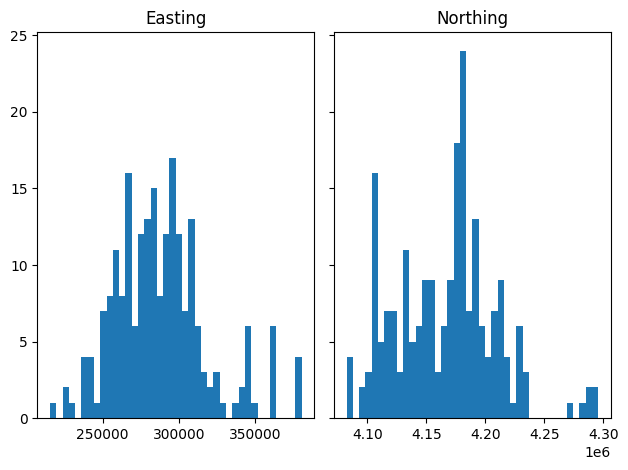

In [15]:
fig, axs = plt.subplots(1, 2, sharey=True, tight_layout=True)
axs[0].hist(df_ages['Easting'], bins=40)
axs[0].set_title('Easting')
axs[1].hist(df_ages['Northing'], bins=40)
axs[1].set_title('Northing')
plt.show()

In [16]:
df_ages[["Easting", "Northing"]].describe()

,Easting,Northing
count,213.000000,2.130000e+02
mean,287934.408451,4.166422e+06
std,30813.133079,4.242211e+04
min,215474.000000,4.082453e+06
25%,267128.000000,4.133500e+06
50%,284031.000000,4.173713e+06
75%,302801.000000,4.190524e+06
max,380250.000000,4.295706e+06


In [17]:
quartile_boundaries_easting = df_ages['Easting'].quantile([0, 0.25, 0.5, 0.75, 1])
df_ages['easting_quartile'] = pd.cut(df_ages['Easting'], bins=quartile_boundaries_easting, labels=[1, 2, 3, 4])
df_ages[["Easting",'easting_quartile']]

,Easting,easting_quartile
0,304057.0,4
1,258103.0,1
2,301629.0,3
3,269559.0,2
4,278808.0,2
...,...,...
212,300174.0,3
213,280583.0,2
214,310708.0,4
215,307123.0,4


In [18]:
# Partition by quartiles for easting and northing
quartile_boundaries_easting = df_ages['Easting'].quantile([0, 0.25, 0.5, 0.75, 1])
quartile_boundaries_northing = df_ages['Northing'].quantile([0, 0.25, 0.5, 0.75, 1])

df_ages['easting_quartile'] = pd.cut(df_ages['Easting'], bins=quartile_boundaries_easting, labels=[1, 2, 3, 4], include_lowest = True)
df_ages['northing_quartile'] = pd.cut(df_ages['Northing'], bins=quartile_boundaries_northing, labels=[1, 2, 3, 4], include_lowest = True)

# Convert categorical characters to numeric
cat_columns = df_ages.select_dtypes(['category']).columns
df_ages[cat_columns] = df_ages[cat_columns].apply(lambda x: x.cat.codes)

# Categorize each square in 2D space of easting and northing boundaries
# such that each unique combination of easting_quartile and northing_quartile
# starting at 1, going left to right across the row, going down a row and repeating, ending at 16
df_ages["square"] = 4*(df_ages['easting_quartile']) + df_ages['northing_quartile'] + 1
df_ages.square.unique()

array([16,  4, 12,  6,  8, 11, 15, 14,  7, 13,  3, 10,  9,  5,  2,  1],
      dtype=int8)

In [19]:
# Graph age density based on category
fig = px.histogram(df_ages, x = "Age", facet_col = 'square', facet_col_wrap = 4,
                   category_orders = {'square': [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]})
fig.show()

## Data Visualization of Ages
Now that the ages are nice and tidy, lets take a look at our data.

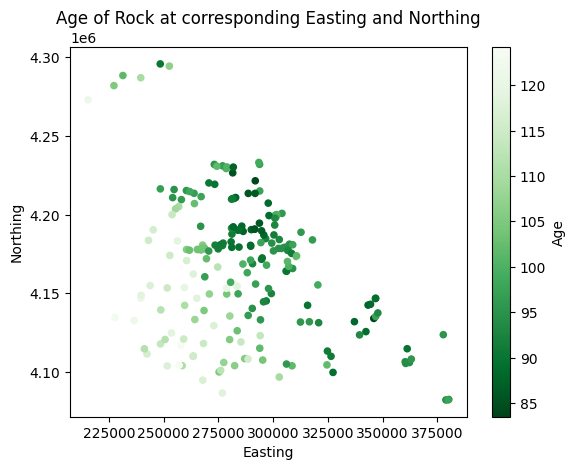

In [20]:
# Scatter plot of each point, colored by its age
df_ages.plot.scatter(x="Easting", y="Northing", c = "Age", cmap = "Greens_r")
plt.title("Age of Rock at corresponding Easting and Northing")
plt.show()

In [21]:
fig = px.scatter(df_ages, x = 'Easting', y = 'Northing', color = 'Age')
fig.show()

In [22]:
fig = px.scatter(df_ages, x = 'Easting', y = 'Age')
fig.show()

In [23]:
fig = px.scatter(df_ages, x = 'Northing', y = 'Age')
fig.show()

<function matplotlib.pyplot.show(close=None, block=None)>

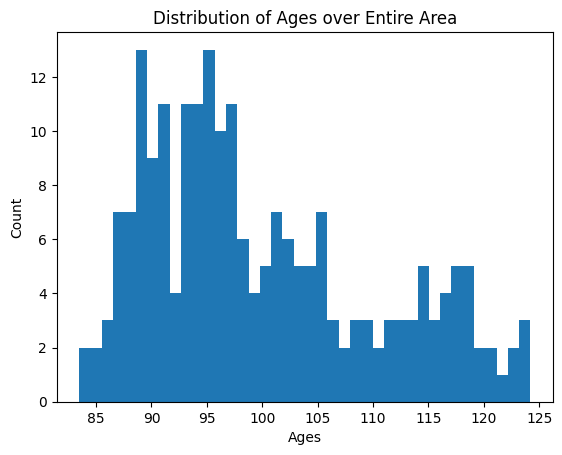

In [24]:
plt.hist(df_ages['Age'], bins = 40)
plt.xlabel("Ages")
plt.ylabel("Count")
plt.title("Distribution of Ages over Entire Area")
plt.show

## Shapefile Data

In [25]:
!python3 -m pip install geopandas

In [26]:
import geopandas as gpd

In [27]:
def read_shapefiles_in_folder(folder_path):
    'FUNCTION TO READ IN ALL SHAPEFILES FROM A FOLDERPATH'
    shapefiles_dict = {}

    # Check if the folder path exists
    if not os.path.exists(folder_path):
        raise FileNotFoundError(f"The folder '{folder_path}' does not exist.")

    # Iterate through files in the folder
    for filename in os.listdir(folder_path):
        if filename.endswith(".shp"):
            file_path = os.path.join(folder_path, filename)

            # Extract file name without extension
            file_name = os.path.splitext(filename)[0]

            # Read shapefile into GeoDataFrame
            gdf = gpd.read_file(file_path)

            # Store GeoDataFrame in the dictionary
            shapefiles_dict[file_name] = gdf

    return shapefiles_dict

In [28]:
os.getcwd()

'/Users/lilynorthcutt/Documents/Projects/sierraNevadaAge'

In [29]:
folder_path = 'Data/raw/CentralSierraMapData_ForLily20231220'

try:
    # Read shapefiles into a dictionary
    shapefiles_data = read_shapefiles_in_folder(folder_path)

    # Access GeoDataFrames by file name
    for file_name, gdf in shapefiles_data.items():
        print(f"File Name: {file_name}")
        #print(gdf.head())  # Display the first few rows of the GeoDataFrame

except FileNotFoundError as e:
    print(e)
except Exception as e:
    print(f"An error occurred: {e}")


File Name: CretaceousIntrusionsIndividualPolygons
File Name: CretaceousIntrusionsExtentPolygons
File Name: DetailedMapDataAreaBoundaryLine
File Name: IntrusiveSuitePolygons


In [30]:
# Coordinate reference system
gdf.crs

<Projected CRS: EPSG:26711>
Name: NAD27 / UTM zone 11N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: North America - between 120°W and 114°W - onshore. Canada - Alberta; British Columbia; Northwest Territories; Nunavut. Mexico. United States (USA) - California; Idaho; Nevada; Oregon; Washington.
- bounds: (-120.0, 26.93, -114.0, 78.13)
Coordinate Operation:
- name: UTM zone 11N
- method: Transverse Mercator
Datum: North American Datum 1927
- Ellipsoid: Clarke 1866
- Prime Meridian: Greenwich

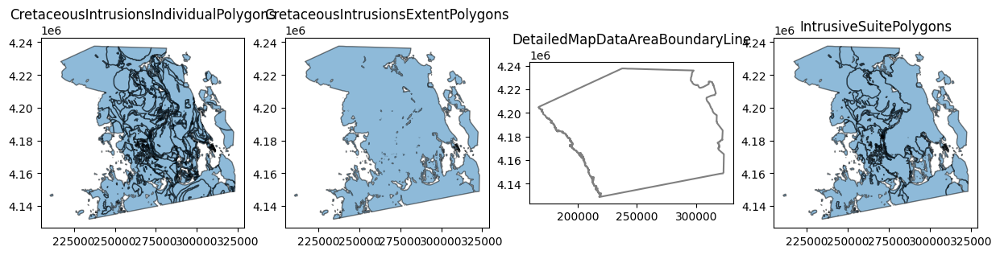

In [31]:
# Plot the files individually
fig, axes = plt.subplots(nrows=1, ncols=len(shapefiles_data), figsize=(15, 5))

for i, (file_name, gdf) in enumerate(shapefiles_data.items()):
    gdf.plot(ax=axes[i], alpha=0.5, edgecolor='k')
    axes[i].set_title(file_name)

plt.show()

/var/folders/dt/qq0h5dqs29d1fxgph58vq8x80000gn/T/ipykernel_64060/504170415.py:9: UserWarning:

Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler



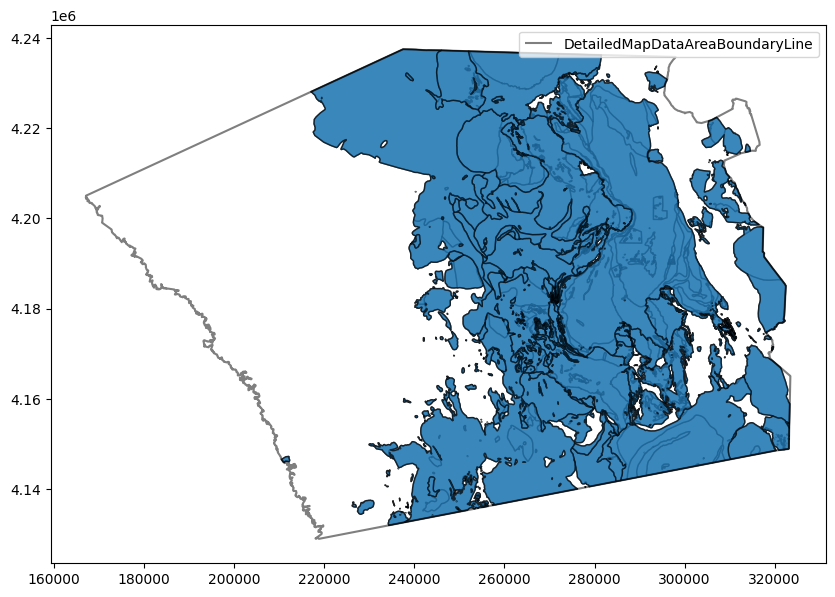

In [32]:
# Plot them together
fig, ax = plt.subplots(figsize=(10, 10))

for file_name, gdf in shapefiles_data.items():
    # Plot each GeoDataFrame on the same axis
    gdf.plot(ax=ax, alpha=0.5, edgecolor='k', label=file_name)

# Add legend
ax.legend()

# Show the plot
plt.show()

### Attributes of the shapefiles

We are reading in 4 different shapefiles:
- __Detailed Map Data Area Boundary Line -__ boundary of area

- __Cretaceous Intrusions Individual Polygons -__ detailed shapefile that has all individually mapped units of Cretaceous intrusions

- __Cretaceous Intrusions Extent Polygons -__ combined units from indiv polygon file s.t. any area of contiguous mapped Cretaceous intrusions becomes a single polygon

- __Intrusive Suite Polygons -__ combined units from indiv polygon file s.t.any area of contiguous mapped Cretacoues intrusions that belong to the same intrusive suite becomes a single polygon

In [33]:
# Number of shapes in each
for file, gdf in shapefiles_data.items():
    print(f"File: {file}   Number of shapes: {len(gdf)}")

File: CretaceousIntrusionsIndividualPolygons   Number of shapes: 1435
File: CretaceousIntrusionsExtentPolygons   Number of shapes: 189
File: DetailedMapDataAreaBoundaryLine   Number of shapes: 1
File: IntrusiveSuitePolygons   Number of shapes: 625


Notes: _extent_ is "more aggressive" at combining than _suite_ as it resulted in fewer shapes

In [34]:
shapefiles_data["CretaceousIntrusionsIndividualPolygons"]

,Age,Label,Unit,Grouping,IntSuite,RockType,Subtype,Comment,Shape_Leng,Shape_Area,geometry
0,eK,bl,Bass Lake,Bass Lake Tonalite,Fine Gold Intrusive Suite,Intrusive,Plutonic,None,739.795946,3.414064e+04,"POLYGON ((257426.387 4136499.165, 257456.02 41..."
1,eK,bl,mafic microtonalite facies,Bass Lake Tonalite,Fine Gold Intrusive Suite,Intrusive,Plutonic,None,19711.170758,1.307741e+07,"POLYGON ((246084.099 4139789.471, 246140.588 4..."
2,eK,bl,microtonalite facies,Bass Lake Tonalite,Fine Gold Intrusive Suite,Intrusive,Plutonic,None,807.122023,3.888118e+04,"POLYGON ((254464.989 4140241.081, 254478.879 4..."
3,eK,sp,Shuteye Peak quartz monzodiorite,Shuteye Peak quartz monzodiorite,Shaver Intrusive Suite,Intrusive,Plutonic,None,513.312351,1.284494e+04,"POLYGON ((277907.294 4140447.286, 277914.173 4..."
4,KJ,mu,None,undivided mafic intrusions,unassigned,Intrusive,Plutonic,None,790.624141,2.507926e+04,"POLYGON ((234210.305 4140536.455, 234204.735 4..."
...,...,...,...,...,...,...,...,...,...,...,...
1430,KJ,mu,None,undivided mafic intrusions,Fine Gold Intrusive Suite?,Intrusive,Plutonic,None,478.124033,1.625629e+04,"POLYGON ((251831.437 4147144.682, 251817.547 4..."
1431,KJ,mu,None,undivided mafic intrusions,Fine Gold Intrusive Suite?,Intrusive,Plutonic,None,463.488336,1.614586e+04,"POLYGON ((262159.713 4153324.617, 262174.001 4..."
1432,KJ,mu,None,undivided mafic intrusions,Fine Gold Intrusive Suite?,Intrusive,Plutonic,None,215.199952,3.021826e+03,"POLYGON ((265543.506 4153675.539, 265539.316 4..."
1433,KJ,mu,None,undivided mafic intrusions,Fine Gold Intrusive Suite?,Intrusive,Plutonic,None,2712.359154,3.353513e+05,"POLYGON ((251364.397 4152885.82, 251339.451 41..."


In [35]:
shapefiles_data["CretaceousIntrusionsExtentPolygons"]

,RockType,Shape_Leng,Shape_Area,CreatedBy,CreateDate,LastEditor,EditDate,geometry
0,Intrusive,2.521207e+02,3.873971e+03,Attia,2023-12-20,Attia,2023-12-20,"POLYGON ((238115.504 4134618.088, 238104.164 4..."
1,Intrusive,1.347295e+04,8.805815e+06,Attia,2023-12-20,Attia,2023-12-20,"POLYGON ((237783.198 4134409.419, 237790.474 4..."
2,Intrusive,5.011541e+02,1.830240e+04,Attia,2023-12-20,Attia,2023-12-20,"POLYGON ((249728.059 4135433.846, 249716.946 4..."
3,Intrusive,3.892306e+02,9.551895e+03,Attia,2023-12-20,Attia,2023-12-20,"POLYGON ((236789.107 4135487.756, 236771.512 4..."
4,Intrusive,1.161742e+03,1.655245e+04,Attia,2023-12-20,Attia,2023-12-20,"POLYGON ((238676.433 4135774.59, 238627.75 413..."
...,...,...,...,...,...,...,...,...
184,Intrusive,1.128577e+03,3.431452e+04,Attia,2023-12-20,Attia,2023-12-20,"POLYGON ((274401.891 4231955.644, 274472.006 4..."
185,Intrusive,2.200742e+04,1.239579e+07,Attia,2023-12-20,Attia,2023-12-20,"POLYGON ((296027.617 4230631.795, 296009.625 4..."
186,Intrusive,1.168315e+03,6.954252e+04,Attia,2023-12-20,Attia,2023-12-20,"POLYGON ((294166.182 4232460.644, 294172.796 4..."
187,Intrusive,1.733900e+03,2.392192e+04,Attia,2023-12-20,Attia,2023-12-20,"POLYGON ((293405.503 4233124.22, 293365.815 42..."


In [36]:
shapefiles_data["IntrusiveSuitePolygons"]

,IntSuite,Shape_Leng,Shape_Area,geometry
0,Jack Main Canyon intrusive suite,1705.180909,1.211059e+05,"POLYGON ((263061.105 4214338.169, 263039.674 4..."
1,Jack Main Canyon intrusive suite,85088.316849,2.039799e+08,"POLYGON ((257224.523 4224282.341, 257233.255 4..."
2,Jack Main Canyon intrusive suite,8819.246797,1.985350e+06,"POLYGON ((259332.361 4227115.885, 259370.688 4..."
3,John Muir Intrusive Suite,30820.887260,5.461314e+07,"POLYGON ((314841.854 4154646.874, 314879.857 4..."
4,John Muir Intrusive Suite,652.394992,1.207175e+04,"POLYGON ((313539.771 4169434.923, 313535.628 4..."
...,...,...,...,...
620,unassigned,22007.421342,1.239579e+07,"POLYGON ((296027.617 4230631.795, 296009.625 4..."
621,unassigned,1168.314686,6.954252e+04,"POLYGON ((294166.182 4232460.644, 294172.796 4..."
622,unassigned,1733.900103,2.392192e+04,"POLYGON ((293405.503 4233124.22, 293365.815 42..."
623,unassigned,20434.400287,6.541468e+06,"POLYGON ((281169.701 4234218.656, 281080.121 4..."


### Individual polygons

Lets take a look at CretaceousIntrusionsIndividualPolygons, as it has the most information

In [37]:
shapefiles_data["CretaceousIntrusionsIndividualPolygons"]

,Age,Label,Unit,Grouping,IntSuite,RockType,Subtype,Comment,Shape_Leng,Shape_Area,geometry
0,eK,bl,Bass Lake,Bass Lake Tonalite,Fine Gold Intrusive Suite,Intrusive,Plutonic,None,739.795946,3.414064e+04,"POLYGON ((257426.387 4136499.165, 257456.02 41..."
1,eK,bl,mafic microtonalite facies,Bass Lake Tonalite,Fine Gold Intrusive Suite,Intrusive,Plutonic,None,19711.170758,1.307741e+07,"POLYGON ((246084.099 4139789.471, 246140.588 4..."
2,eK,bl,microtonalite facies,Bass Lake Tonalite,Fine Gold Intrusive Suite,Intrusive,Plutonic,None,807.122023,3.888118e+04,"POLYGON ((254464.989 4140241.081, 254478.879 4..."
3,eK,sp,Shuteye Peak quartz monzodiorite,Shuteye Peak quartz monzodiorite,Shaver Intrusive Suite,Intrusive,Plutonic,None,513.312351,1.284494e+04,"POLYGON ((277907.294 4140447.286, 277914.173 4..."
4,KJ,mu,None,undivided mafic intrusions,unassigned,Intrusive,Plutonic,None,790.624141,2.507926e+04,"POLYGON ((234210.305 4140536.455, 234204.735 4..."
...,...,...,...,...,...,...,...,...,...,...,...
1430,KJ,mu,None,undivided mafic intrusions,Fine Gold Intrusive Suite?,Intrusive,Plutonic,None,478.124033,1.625629e+04,"POLYGON ((251831.437 4147144.682, 251817.547 4..."
1431,KJ,mu,None,undivided mafic intrusions,Fine Gold Intrusive Suite?,Intrusive,Plutonic,None,463.488336,1.614586e+04,"POLYGON ((262159.713 4153324.617, 262174.001 4..."
1432,KJ,mu,None,undivided mafic intrusions,Fine Gold Intrusive Suite?,Intrusive,Plutonic,None,215.199952,3.021826e+03,"POLYGON ((265543.506 4153675.539, 265539.316 4..."
1433,KJ,mu,None,undivided mafic intrusions,Fine Gold Intrusive Suite?,Intrusive,Plutonic,None,2712.359154,3.353513e+05,"POLYGON ((251364.397 4152885.82, 251339.451 41..."


In [38]:
gdf = shapefiles_data["CretaceousIntrusionsIndividualPolygons"]

for column in gdf.columns:
    print(f'Column {column}: {gdf[column].nunique()} unique vals')

Column Age: 5 unique vals
Column Label: 69 unique vals
Column Unit: 210 unique vals
Column Grouping: 87 unique vals
Column IntSuite: 26 unique vals
Column RockType: 1 unique vals
Column Subtype: 5 unique vals
Column Comment: 38 unique vals
Column Shape_Leng: 1435 unique vals
Column Shape_Area: 1435 unique vals
Column geometry: 1435 unique vals


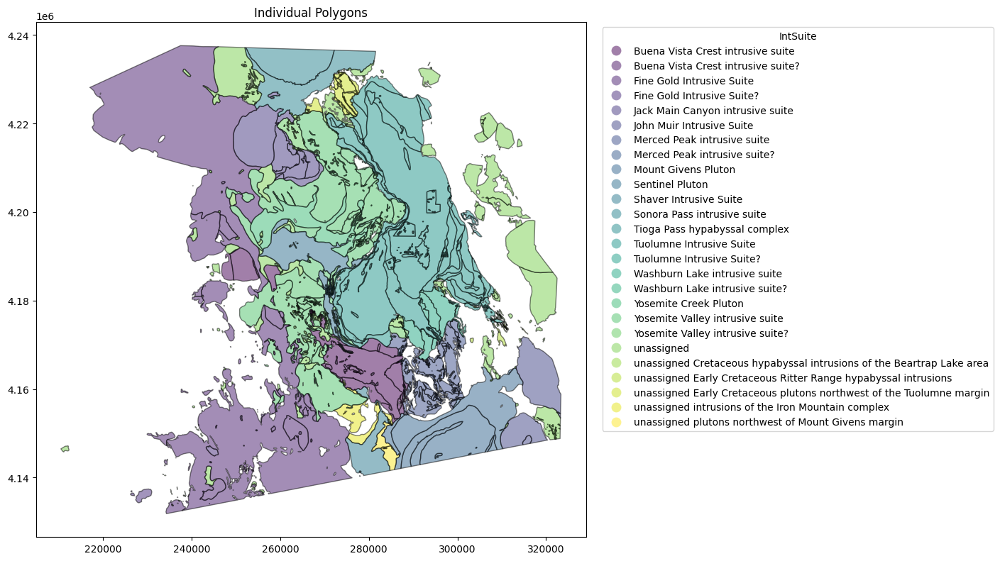

In [39]:
# Plot the files individually
legend_criteria = "IntSuite"

ax = gdf.plot(figsize=(10, 10), alpha=0.5, edgecolor='k',column=legend_criteria, cmap='viridis', legend=True)

legend = ax.get_legend()
legend.set_bbox_to_anchor((1.75, 1))
legend.set_title(legend_criteria)


ax.set_title(f'Individual Polygons')
plt.show()

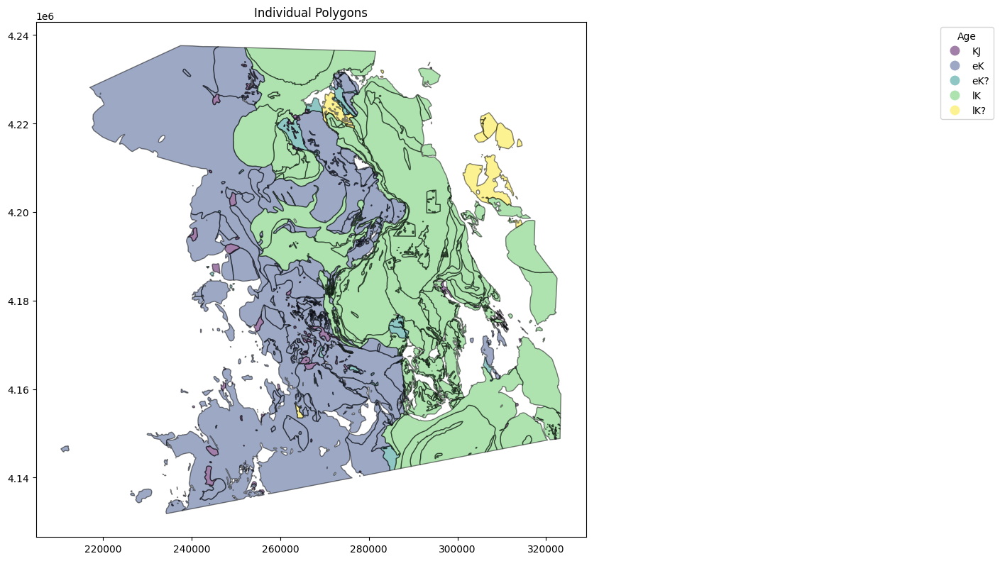

In [40]:
# Plot the files individually
legend_criteria = "Age"

ax = gdf.plot(figsize=(10, 10), alpha=0.5, edgecolor='k',column=legend_criteria, cmap='viridis', legend=True)

legend = ax.get_legend()
legend.set_bbox_to_anchor((1.75, 1))
legend.set_title(legend_criteria)


ax.set_title(f'Individual Polygons')
plt.show()

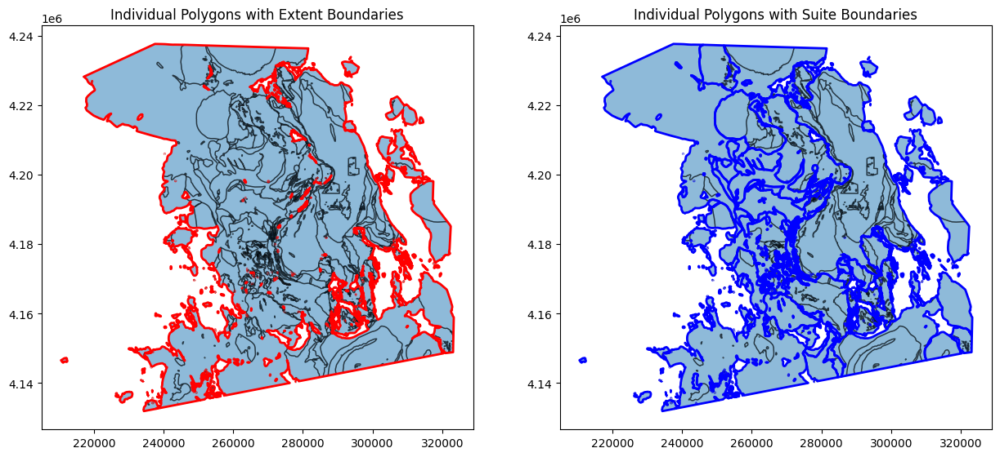

In [41]:
# Look at Difference between Extent vs. Suite
gdf_detailed = shapefiles_data["CretaceousIntrusionsIndividualPolygons"]
gdf_extent = shapefiles_data["CretaceousIntrusionsExtentPolygons"]
gdf_suite = shapefiles_data["IntrusiveSuitePolygons"]


fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 10))
color_column = "Age"

axes[0].set_title('Individual Polygons with Extent Boundaries')
gdf_detailed.plot(ax=axes[0], alpha=0.5, edgecolor='k')
gdf_extent.boundary.plot(ax=axes[0], color='red', linewidth=2) 

axes[1].set_title('Individual Polygons with Suite Boundaries')
gdf_detailed.plot(ax=axes[1], alpha=0.5, edgecolor='k')
gdf_suite.boundary.plot(ax=axes[1], color='Blue', linewidth=2) 

plt.show()

# Putting them together

Adding ages ontop of the shapefiles

In [42]:
shapefiles_data["CretaceousIntrusionsIndividualPolygons"]

,Age,Label,Unit,Grouping,IntSuite,RockType,Subtype,Comment,Shape_Leng,Shape_Area,geometry
0,eK,bl,Bass Lake,Bass Lake Tonalite,Fine Gold Intrusive Suite,Intrusive,Plutonic,None,739.795946,3.414064e+04,"POLYGON ((257426.387 4136499.165, 257456.02 41..."
1,eK,bl,mafic microtonalite facies,Bass Lake Tonalite,Fine Gold Intrusive Suite,Intrusive,Plutonic,None,19711.170758,1.307741e+07,"POLYGON ((246084.099 4139789.471, 246140.588 4..."
2,eK,bl,microtonalite facies,Bass Lake Tonalite,Fine Gold Intrusive Suite,Intrusive,Plutonic,None,807.122023,3.888118e+04,"POLYGON ((254464.989 4140241.081, 254478.879 4..."
3,eK,sp,Shuteye Peak quartz monzodiorite,Shuteye Peak quartz monzodiorite,Shaver Intrusive Suite,Intrusive,Plutonic,None,513.312351,1.284494e+04,"POLYGON ((277907.294 4140447.286, 277914.173 4..."
4,KJ,mu,None,undivided mafic intrusions,unassigned,Intrusive,Plutonic,None,790.624141,2.507926e+04,"POLYGON ((234210.305 4140536.455, 234204.735 4..."
...,...,...,...,...,...,...,...,...,...,...,...
1430,KJ,mu,None,undivided mafic intrusions,Fine Gold Intrusive Suite?,Intrusive,Plutonic,None,478.124033,1.625629e+04,"POLYGON ((251831.437 4147144.682, 251817.547 4..."
1431,KJ,mu,None,undivided mafic intrusions,Fine Gold Intrusive Suite?,Intrusive,Plutonic,None,463.488336,1.614586e+04,"POLYGON ((262159.713 4153324.617, 262174.001 4..."
1432,KJ,mu,None,undivided mafic intrusions,Fine Gold Intrusive Suite?,Intrusive,Plutonic,None,215.199952,3.021826e+03,"POLYGON ((265543.506 4153675.539, 265539.316 4..."
1433,KJ,mu,None,undivided mafic intrusions,Fine Gold Intrusive Suite?,Intrusive,Plutonic,None,2712.359154,3.353513e+05,"POLYGON ((251364.397 4152885.82, 251339.451 41..."


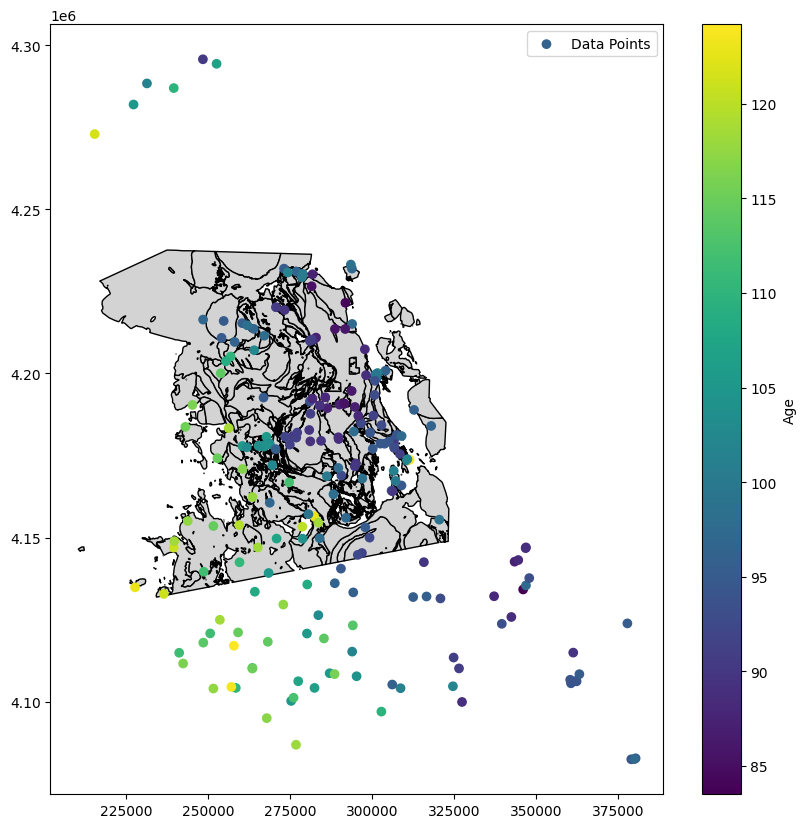

In [43]:
fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(ax=ax, color='lightgray', edgecolor='black')

sc = ax.scatter(df_ages['Easting'], df_ages['Northing'], c=df_ages['Age'], cmap='viridis', label = "Data Points" )
cbar = plt.colorbar(sc, ax=ax, label='Age')

ax.legend()

# Show the plot
plt.show()

# Interactive map

Create an interactive map to look more in depth! In this section I want to:
   1. Explore the data with some different maps, and 
   2. Explore different visualization methods for GIS in python


### Scatter Plot Using _PLOTLY EXPRESS_

In [44]:
shapefiles_data["CretaceousIntrusionsIndividualPolygons"]["geometry"]

0       POLYGON ((257426.387 4136499.165, 257456.02 41...
1       POLYGON ((246084.099 4139789.471, 246140.588 4...
2       POLYGON ((254464.989 4140241.081, 254478.879 4...
3       POLYGON ((277907.294 4140447.286, 277914.173 4...
4       POLYGON ((234210.305 4140536.455, 234204.735 4...
                              ...                        
1430    POLYGON ((251831.437 4147144.682, 251817.547 4...
1431    POLYGON ((262159.713 4153324.617, 262174.001 4...
1432    POLYGON ((265543.506 4153675.539, 265539.316 4...
1433    POLYGON ((251364.397 4152885.82, 251339.451 41...
1434    POLYGON ((256472.103 4154210.01, 256418.525 41...
Name: geometry, Length: 1435, dtype: geometry

In [45]:
# Create px plot of each location, colored in by age
fig = px.scatter_geo(df_ages, lat = "lat", lon = "long", color = "Age", projection= "natural earth" )
# Closest scope is North American, zoom in on our data
fig.update_geos(fitbounds="locations")
# Add basemap - Unable to add USGS basemap;https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x};
# needs follow-up 

fig.show()

Summary: Not my favorite plotting method

It is pretty simple and easy, however adding a basemap is not working for me.
When attempting to plot terrain basemap from USGS, it will not show up
One reason for this is that I may need an access token from mapbox. This is less than ideal as a credit
card is needed to sign up.

It is easy to plot, but the lack of native basemap is a drawback

### Folium


In [49]:
# Make Age column numeric because folium having trouble ordering char
#https://geopandas.org/en/stable/gallery/polygon_plotting_with_folium.html

shapefiles_data["CretaceousIntrusionsIndividualPolygons"].Age.unique()
#array(['eK', 'KJ', 'lK', 'eK?', 'lK?'], dtype=object)

# J: 201.3-145.0 MYA
# K: 145.0-66.0 MYA
# Thus mapping eK to mean(145 and mean(145, 66)), lK to mean(mean(145, 66), 66) and KJ to 145
# Note that the oldest point in df_ages is 124.2
k_mean = (145+66)/2 ; eK_mean = (145+k_mean)/2; lk_mean = (k_mean+66)/2; kJ = 145;
(shapefiles_data["CretaceousIntrusionsIndividualPolygons"])["ageNum"] = shapefiles_data["CretaceousIntrusionsIndividualPolygons"].Age.apply(
    lambda x: eK_mean if (x == 'eK' or x == 'eK?') else(lk_mean if (x == 'lK' or x == 'lK?') else kJ))

In [50]:
# Make points a POINT() geometry
# EPSG:26711
df_folium = gpd.GeoDataFrame(df_ages, geometry=gpd.points_from_xy(df_ages.Easting, df_ages.Northing),  crs='epsg:26711')

In [51]:
max(df_folium["Age"])

124.2

In [52]:
from branca.colormap import linear
# In order to color on the same scale we need to normalize ages between the two data sources
# and create a color scale
min_age = min(min(df_folium["Age"]),min(shapefiles_data["CretaceousIntrusionsIndividualPolygons"]["ageNum"]))
max_age = max(max(df_folium["Age"]),max(shapefiles_data["CretaceousIntrusionsIndividualPolygons"]["ageNum"]))
colormap = linear.YlOrRd_09.scale(min_age, max_age)

In [53]:
# IDs for each polygon in each shapefile
(shapefiles_data["DetailedMapDataAreaBoundaryLine"])["id"] = shapefiles_data["DetailedMapDataAreaBoundaryLine"].index.astype(str)
(shapefiles_data["CretaceousIntrusionsIndividualPolygons"])["id"] = shapefiles_data["CretaceousIntrusionsIndividualPolygons"].index.astype(str)
(shapefiles_data["CretaceousIntrusionsExtentPolygons"])["id"] = shapefiles_data["CretaceousIntrusionsExtentPolygons"].index.astype(str)
(shapefiles_data["IntrusiveSuitePolygons"])["id"] = shapefiles_data["IntrusiveSuitePolygons"].index.astype(str)


In [54]:
# PLOT

# Add a layer to interactive map
tileOptions = ["Stadia.StamenTerrain", "OpenTopoMap", "Stadia.AlidadeSmooth",
              "Esri.WorldImagery"]

interactive_map = folium.Map(
    location=(37.75, -119.8),
    zoom_start=9.25,
    control_scale=True,
    tiles="Esri.WorldShadedRelief"
)

# Add baselayer
#folium.Map(tiles="OpenTopoMap").add_to(interactive_map)

# Boundary Layer
boundary_layer = folium.GeoJson(data=shapefiles_data["DetailedMapDataAreaBoundaryLine"][["geometry", "id"]],
                               style_function=lambda feature: {
                                   "color": "black",
                                   "weight": 5,
                                   "dashArray": "5, 20"
                               }).add_to(interactive_map)
# Create Popup template for locations
popup_shp = folium.GeoJsonPopup(
    fields=["Age", "ageNum"],
    aliases=["Period: ", "Approx. Age:"],
    localize=True,
    labels=True,
    style="background-color: yellow;",
)

tooltip_shp = folium.GeoJsonTooltip(
    fields=["Age", "ageNum"],
    aliases=["Period: ", "Approx Age: "],
    localize=True,
    sticky=False,
    labels=True,
    style="""
        background-color: #F0EFEF;
        border: 2px solid black;
        border-radius: 3px;
        box-shadow: 3px;
    """,
    max_width=800,
)


# Individual polygon layer
folium.GeoJson(
    shapefiles_data["CretaceousIntrusionsIndividualPolygons"],
    style_function=lambda x: {
        'fillColor': colormap(x['properties']["ageNum"]),
        'color': 'Black',
        'weight': 2,
        'fillOpacity': 0.7
    },
    tooltip=tooltip_shp,
    popup=popup_shp,
).add_to(interactive_map)

# Create Popup template for locations
popup_location = folium.GeoJsonPopup(
    fields=["Age"],
    aliases=["Age"],
    localize=True,
    labels=True,
    style="background-color: yellow;",
)

tooltip_location = folium.GeoJsonTooltip(
    fields=["Age"],
    aliases=["Age: "],
    localize=True,
    sticky=False,
    labels=True,
    style="""
        background-color: #F0EFEF;
        border: 2px solid black;
        border-radius: 3px;
        box-shadow: 3px;
    """,
    max_width=800,
)

# Age by location layer
folium.GeoJson(
    df_folium,
    name = "Ages at Location",
    marker=folium.Circle(radius=1500, color = 'Black', fill_opacity = 1, fillColor = 'Black'),
    style_function=lambda x: {
        'fillColor': colormap(x['properties']["Age"]), 
        'color': colormap(x['properties']["Age"]),
        'radius': 1500
    },
    tooltip=tooltip_location,
    popup=popup_location,
).add_to(interactive_map)


# Add layers to map
colormap.add_to(interactive_map)

interactive_map.save("folium_map.html")
interactive_map

The map itself is nicer, and much more customizable. There was a steeper learning curve in using folium, but it was worth it. However I can not see the graph in my IDE (PyCharm) although I believe you can in Jupyter labs&notebooks. In order
to view the graph, I have to look at the html file.

### DASH Animation

# Save Data to processed

In [80]:
# Save pandas df with longitude, latitude, and age
df_ages.to_csv('Data/processed/Points/points.csv', index=False)
df_folium.to_file('Data/processed/Points/points.geojson', driver='GeoJSON')

# Safe geopandas df with polygons, age, and period
for key in shapefiles_data.keys():
    path = 'Data/processed/Polygons/'+key+'.geojson'
    shapefiles_data[key].to_file(path, driver='GeoJSON')

# shapefiles_data["CretaceousIntrusionsIndividualPolygons"].to_file("Data/processed/allPolygons_singlefile.geojson", driver='GeoJSON')
#  

Make sure we can read the data back in 


In [95]:
# Read in points df
points_path = 'Data/processed/Points/points'
#CSV
df_ages_test = pd.read_csv(points_path+'.csv')

# GEOJSON
file = open(points_path + '.geojson')
df_folium_test = gpd.read_file(file)

In [121]:
# Read in polygons
polygon_path = 'Data/processed/Polygons/'
dir_list = os.listdir(polygon_path)


shapefiles_data_test = {}
for file in dir_list:
    filename = file.split('.')[0]
    file = open(polygon_path + file)
    shapefiles_data_test[filename] = gpd.read_file(file)
    
    #print(i.split('.', 1)[0])



In [122]:
for file, gdf in shapefiles_data_test.items():
    print(f"File: {file}   Number of shapes: {len(gdf)}")

File: CretaceousIntrusionsExtentPolygons   Number of shapes: 189
File: IntrusiveSuitePolygons   Number of shapes: 625
File: DetailedMapDataAreaBoundaryLine   Number of shapes: 1
File: CretaceousIntrusionsIndividualPolygons   Number of shapes: 1435
